# The Debuggers - Disease Classification Project

## By: Albert Hung, Anish Kothapalli, Anshul Sinha, and Eric Gohl

In [ ]:
import csv
import pandas as pd
import numpy as np
import pickle
import os
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.tree import DecisionTreeClassifier  
from sklearn.metrics import accuracy_score  
from sklearn.metrics import silhouette_samples
from sklearn.metrics import silhouette_score
from matplotlib.pyplot import figure
from matplotlib import cm

import matplotlib as plt 
from sklearn.preprocessing import MultiLabelBinarizer
from sklearn.preprocessing import LabelEncoder
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
from google.colab import files

from sklearn.linear_model import LogisticRegression

import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import ListedColormap
from sklearn import neighbors, datasets

from sklearn.decomposition import PCA 
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import multilabel_confusion_matrix
from sklearn.metrics import plot_confusion_matrix
from sklearn.metrics import f1_score
import collections

from sklearn.cluster import KMeans
from sklearn.cluster import AgglomerativeClustering
from sklearn.model_selection import cross_val_score

In [ ]:
# Connecting to Google Drive

from google.colab import drive
drive.mount('/content/drive')

root_path = 'drive/Shareddrives/Debuggers Disease Prediction Project/Pickled Models/'  #change dir to your project folder

Mounted at /content/drive


In [ ]:
# Creating Functions for Checking if File has Been Pickled Yet

def picklecheck(filename1):
  filepath1 = root_path + filename1
  return os.path.exists(filepath1)

def picklesave(filename2, model):
  filepath = root_path + filename2
  pickle_out = open(filepath, "wb")
  pickle.dump(model, pickle_out)
  pickle_out.close()

def pickleload(filename):
  filepath2 = root_path + filename
  pickle_in = open(filepath2, "rb")
  model = pickle.load(pickle_in)
  return model

In [ ]:
uploaded = files.upload()

# reading the csv and seperating the prognosis and symptoms 
df = pd.read_csv('prognosis_and_symptoms.csv', sep = ';')
prognosis = df.iloc[:,0]
symptoms = df.iloc[:,1]
# splitting all of the symptoms and putting them into their own column 
symptoms = (symptoms.str.split(',', expand=True))

Saving prognosis_and_symptoms.csv to prognosis_and_symptoms.csv


In [ ]:
#getting unique prognosis
prognosis_unique = np.unique(prognosis.values)
print(prognosis_unique)

#encoding prognosis
label_encoder = LabelEncoder()
label_encoded_y = label_encoder.fit_transform(prognosis)

# getting unique symptoms
symptoms_list = symptoms.values.tolist()
symptoms_np = symptoms.to_numpy()
symptoms_np_1d = symptoms_np.flatten()
symptoms_count = collections.Counter(symptoms_np_1d)
del symptoms_count[None]
symptoms_unique = list(symptoms_count.keys())

#one hot encoding the symptoms
one_hot = MultiLabelBinarizer(classes = symptoms_unique)
one_hot_encoded_data = one_hot.fit_transform(symptoms_list)
one_hot_decoded_data = one_hot.inverse_transform(one_hot_encoded_data)


X_train, X_test, y_train, y_test = train_test_split(one_hot_encoded_data, label_encoded_y, test_size=0.3, random_state=42, stratify = prognosis)
label_decoded_y_actual = label_encoder.inverse_transform(y_test)

['(vertigo) Paroymsal  Positional Vertigo' 'AIDS' 'Acne'
 'Alcoholic hepatitis' 'Allergy' 'Arthritis' 'Bronchial Asthma'
 'Cervical spondylosis' 'Chicken pox' 'Chronic cholestasis' 'Common Cold'
 'Dengue' 'Diabetes ' 'Dimorphic hemmorhoids(piles)' 'Drug Reaction'
 'Fungal infection' 'GERD' 'Gastroenteritis' 'Heart attack' 'Hepatitis B'
 'Hepatitis C' 'Hepatitis D' 'Hepatitis E' 'Hypertension '
 'Hyperthyroidism' 'Hypoglycemia' 'Hypothyroidism' 'Impetigo' 'Jaundice'
 'Malaria' 'Migraine' 'Osteoarthristis' 'Paralysis (brain hemorrhage)'
 'Peptic ulcer diseae' 'Pneumonia' 'Psoriasis' 'Tuberculosis' 'Typhoid'
 'Urinary tract infection' 'Varicose veins' 'hepatitis A']


/usr/local/lib/python3.7/dist-packages/sklearn/preprocessing/_label.py:876: UserWarning: unknown class(es) [None] will be ignored
  "unknown class(es) {0} will be ignored".format(sorted(unknown, key=str))


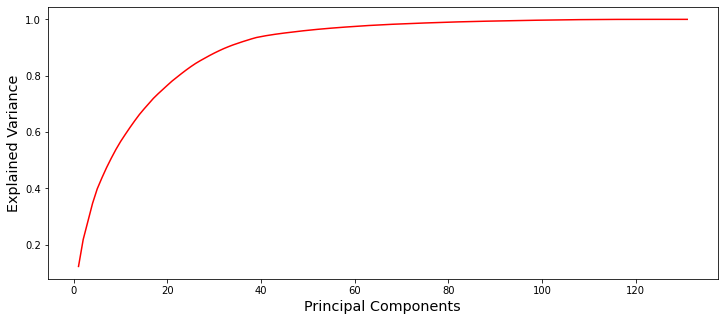

In [ ]:
pca1 = PCA() #call PCA class
X_train_pca = pca1.fit_transform(X_train) #apply pca
X_test_pca = pca1.transform(X_test)
pca1.explained_variance_ratio_   #print explained variance of each PC

fig, axes = plt.subplots(figsize=(12,5))

plt.plot(range(1, 132), np.cumsum(pca1.explained_variance_ratio_), 'r')
plt.ylabel('Explained Variance', fontsize='x-large')
plt.xlabel('Principal Components', fontsize='x-large')

plt.show()

In [ ]:
# hardcoded ideal random forest hyperparameters


if(picklecheck("forest_ideal.pickle") == 0):
  forest_ideal = RandomForestClassifier(n_estimators = 23, max_depth = 16, max_leaf_nodes = 24, 
                                      min_samples_split = 22, criterion='gini', random_state=42, n_jobs=-1)


  forest_ideal.fit(X_train, y_train)
  picklesave("forest_ideal.pickle", forest_ideal)
  print("IT WAS SAVED")
else:
  forest_ideal = pickleload("forest_ideal.pickle")
  print("IT WAS LOADED IN")

y_test_predict_ideal = forest_ideal.predict(X_test)
label_decoded_y_ideal = label_encoder.inverse_transform(y_test_predict_ideal)

# print accuracy score
accuracy_score(label_decoded_y_actual, label_decoded_y_ideal) 

IT WAS LOADED IN


0.8955873213175886

In [ ]:
# KNN GRIDSEARCH CV

if(picklecheck("knn.pickle") == 0):
  params_knn = {'n_neighbors': list(range(1, 100))}
  knn = GridSearchCV(KNeighborsClassifier(p = 2, metric = 'minkowski'), params_knn, n_jobs = -1, verbose = 1, cv = 5)

  knn.fit(X_train, y_train)
  picklesave("knn.pickle", knn)
  print("IT WAS SAVED")
else:
  knn = pickleload("knn.pickle")
  print("IT WAS LOADED IN")

print(knn.best_estimator_)
y_predict_knn = knn.predict(X_test)
label_decoded_y_knn = label_encoder.inverse_transform(y_predict_knn)
label_decoded_y_actual = label_encoder.inverse_transform(y_test)

# print accuracy score
accuracy_score(label_decoded_y_actual, label_decoded_y_knn) 

IT WAS LOADED IN
KNeighborsClassifier(n_neighbors=12)


0.9322560596643878

In [ ]:
# Training logistic regression 

if(picklecheck("lr.pickle") == 0):

  lr = LogisticRegression()

  grid={"C":np.logspace(-3,3,7), "penalty":["l2"], "max_iter":[10000], "solver":["lbfgs"]}
  lr = GridSearchCV(lr, grid, n_jobs = -1, verbose = 3, cv = 5)

  lr.fit(X_train, y_train)
  picklesave("lr.pickle", lr)
  print("IT WAS SAVED")
else:
  lr = pickleload("lr.pickle")
  print("IT WAS LOADED IN")

print(lr.best_estimator_)
y_predict_lr = lr.predict(X_test)

label_decoded_y_lr = label_encoder.inverse_transform(y_predict_lr)

# print accuracy score
accuracy_score(label_decoded_y_actual, label_decoded_y_lr) 

IT WAS LOADED IN
LogisticRegression(C=0.1, max_iter=10000)


0.9322560596643878

In [ ]:
#printing probability for top 5 predictions
probs = lr.predict_proba(X_test)
top_n = np.argsort(probs)[:,:1:-1]

for a in probs:
    highest_prob_index = (np.argsort(a)[-5:])
    highest_index_val = [a[i] for i in highest_prob_index]
    highest_prob_index[:]= highest_prob_index[::-1]
    highest_index_val.reverse()
    highest_prob_index = label_encoder.inverse_transform(highest_prob_index)
    merged_tuple = tuple(zip(highest_prob_index, highest_index_val))
    print(merged_tuple)

(('Osteoarthristis', 0.6831814316139788), ('Arthritis', 0.03269689757256446), ('AIDS', 0.02480824349059505), ('Allergy', 0.015770873050540705), ('Hypertension ', 0.013875633714879597))
(('Osteoarthristis', 0.6779563230283946), ('Cervical spondylosis', 0.03741164102044287), ('Arthritis', 0.030504373829772828), ('AIDS', 0.022099538206177133), ('Allergy', 0.014038815038474596))
(('Hepatitis E', 0.8054355979275746), ('Hepatitis D', 0.03940484407634147), ('Chronic cholestasis', 0.03692639197103659), ('Hepatitis C', 0.020455033763286324), ('Typhoid', 0.011086895550013912))
(('Allergy', 0.7517690657516177), ('Common Cold', 0.0168384877300038), ('Jaundice', 0.015388144101416493), ('Varicose veins', 0.011923061133834774), ('Urinary tract infection', 0.011106590164361753))
(('Chronic cholestasis', 0.7802188105581415), ('Jaundice', 0.025905502886689996), ('Peptic ulcer diseae', 0.01464365057172064), ('Alcoholic hepatitis', 0.014191583043075178), ('Hepatitis D', 0.012472563541602026))
(('Bronchial

In [ ]:
# Testing different PCA components with LR

pca_lr_index = [15, 30, 45, 60, 75, 90, 105]
pca_lr_accuracy = []
gridCV={"C":np.logspace(-3,3,7), "penalty":["l2"], "max_iter":[10000], "solver":["lbfgs"]}
params_lr = {'n_neighbors': list(range(1, 100))}
for a in pca_lr_index:
    pca = PCA(n_components = a) #call PCA class
    pca.fit(X_train)
    X_train_pca = pca.transform(X_train)
    X_test_pca = pca.transform(X_test)
    if(picklecheck("lr_pca" + str(pca_lr_index.index(a)) + ".pickle") == 0):
      lr_pca = LogisticRegression()
      lr_pca = GridSearchCV(lr_pca, gridCV, n_jobs = -1, verbose = 3, cv = 5)
      lr_pca.fit(X_train_pca, y_train)
    
      picklesave(("lr_pca" + str(pca_lr_index.index(a)) + ".pickle"), lr_pca)
      print("IT WAS SAVED")
    else:
      lr_pca = pickleload(("lr_pca" + str(pca_lr_index.index(a)) + ".pickle"))
      print("IT WAS LOADED IN")
      
    print(lr_pca.best_estimator_)
    y_predict_lr_pca = lr_pca.predict(X_test_pca)
    label_decoded_y_lr_pca = label_encoder.inverse_transform(y_predict_lr_pca)
    pca_lr_accuracy.append(accuracy_score(label_decoded_y_actual, label_decoded_y_lr_pca))


IT WAS LOADED IN
LogisticRegression(C=1000.0, max_iter=10000)
IT WAS LOADED IN
LogisticRegression(C=10.0, max_iter=10000)
IT WAS LOADED IN
LogisticRegression(C=0.1, max_iter=10000)
IT WAS LOADED IN
LogisticRegression(C=0.1, max_iter=10000)
IT WAS LOADED IN
LogisticRegression(C=0.1, max_iter=10000)
IT WAS LOADED IN
LogisticRegression(C=0.1, max_iter=10000)
IT WAS LOADED IN
LogisticRegression(C=0.1, max_iter=10000)


[0.9260410192666252, 0.9322560596643878, 0.9322560596643878, 0.9322560596643878, 0.9322560596643878, 0.9322560596643878, 0.9322560596643878]


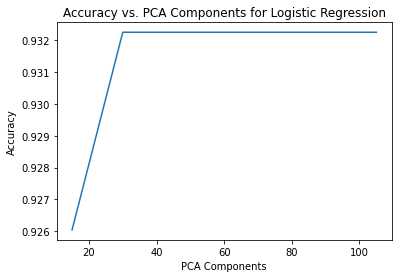

In [ ]:
#Plotting Accuracy vs PCA components for Logistic Regression
print(pca_lr_accuracy)
plt.plot(pca_lr_index, pca_lr_accuracy)
plt.xlabel("PCA Components")
plt.ylabel("Accuracy")
plt.title("Accuracy vs. PCA Components for Logistic Regression")
plt.show()

In [ ]:
#Plotting the correct prediction percentage for each disease using logistic regression 
#Note: The label (percentage correct) are not shown in this iteration because the built in label function is not in the older version of MatPlotLib that
#is defaulted in colab. Please refer to the paper for the completed figure
lr_cm = confusion_matrix(label_decoded_y_actual, label_decoded_y_lr, normalize = 'true')
lr_cm_perc = lr_cm.diagonal()

fig = plt.figure()
ax = fig.add_axes([0,0,1,1])
lr_cm_perc_sorted = sorted(zip(prognosis_unique, lr_cm_perc), key = lambda x:x[1])
prognosis_unique_sorted_lr =[]
lr_cm_sorted = []
for a, b in lr_cm_perc_sorted:
    prognosis_unique_sorted_lr.append(a)
    lr_cm_sorted.append(b)
bars = ax.barh(prognosis_unique_sorted_lr,lr_cm_sorted, color = ['r' if a < 0.85 else 'g' for a in lr_cm_sorted])

ax.set_title('Logistic Regression', fontsize = 30)
ax.set_xlabel('Accuracy', fontsize = 25)
ax.set_ylabel('Predicted Prognosis', fontsize = 25)
# ax.bar_label(bars, fontsize = 15)
ax.set_xlim(xmin = 0.7)
for label in (ax.get_xticklabels() + ax.get_yticklabels()):
    label.set_fontsize(16)
fig.set_size_inches(15,10)
fig.set_dpi(1000)
    
plt.savefig("lr_accuracy.jpeg", bbox_inches='tight')

In [ ]:
#average vector calculation
average_vector = []
for b in prognosis_unique:
    curr_vec = []
    for a in range(len(prognosis)):
        if(prognosis[a] == b):
            curr_vec.append(one_hot_encoded_data[a])
    curr_vec = np.asarray(curr_vec)
    average_vector.append((curr_vec.mean(axis = 0)).tolist())

In [ ]:
# Defining functions to create a lists of list for MLP gridsearch

def layerlistgenerator(interval, max_size, max_layers):
  hidden_layer_list = []
  sublist = []
  for i in range (max_layers):
    for j in range(int(max_size / interval)):
      sublist = [max_size] * i
      sublist.append(interval * (j + 1))
      hidden_layer_list.append(sublist)

  return hidden_layer_list

def gen2layerlistgenerator(interval, max_size, layers):
  list = []
  sublist = []
  for i in range(int(max_size / interval)):
    sublist = [interval * (i + 1)] * layers
    list.append(sublist)
  return list

In [ ]:
# Gaining access to Google Drive

from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# PCA for Neural Network and training the model

pcaNN = PCA(n_components=60)
X_train_pcaNN = pca.fit_transform(X_train)
X_test_pcaNN = pca.transform(X_test)

if(picklecheck("NN.pickle") == 0):
  # NNparams = {"hidden_layer_sizes": layerlistgenerator(2, 15, 2)}
  Optimal_Params = {"hidden_layer_sizes": [10]}
  mlp = MLPClassifier(max_iter=200, activation="tanh", solver="adam")
  NN = GridSearchCV(mlp, Optimal_Params, n_jobs = -1, verbose = 1, cv = 5)

  NN.fit(X_train_pcaNN, y_train)
  picklesave("NN.pickle", NN)
  print("IT WAS SAVED")
else:
  NN = pickleload("NN.pickle")
  print("IT WAS LOADED IN")

NNpred = NN.predict(X_test_pcaNN)

label_decoded_y_actual = label_encoder.inverse_transform(y_test)
label_decoded_y_NN = label_encoder.inverse_transform(NNpred)

print(accuracy_score(label_decoded_y_actual, label_decoded_y_NN))

IT WAS LOADED IN
0.9322560596643878


In [ ]:
# Calculating accuracy score on test set with different #'s of PCA components and
# performing it multiple times with different random seeds and averaging the results

full_score = np.array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0])
for i in range(0, 3):
  pca_nn_accuracy = np.array([])
  pca_index = [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, 120, 130]
  for a in pca_index:
    pca = PCA(n_components = a) #call PCA class
    pca.fit(X_train)
    X_train_pca = pca.transform(X_train)
    X_test_pca = pca.transform(X_test)
    clf_pca = MLPClassifier(solver='adam', hidden_layer_sizes = 10, activation = "tanh", max_iter = 100, random_state = (a*(i+1)))
    clf_pca.fit(X_train_pca, y_train)
    y_predict_nn_pca = clf_pca.predict(X_test_pca)
    label_decoded_y_nn_pca = label_encoder.inverse_transform(y_predict_nn_pca)
    pca_nn_accuracy = np.append(pca_nn_accuracy, accuracy_score(label_decoded_y_actual, label_decoded_y_nn_pca))

  full_score = full_score + pca_nn_accuracy

full_score = full_score / 3

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  ConvergenceWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  ConvergenceWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  ConvergenceWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  ConvergenceWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multi

[0.89446861 0.92044748 0.93039155 0.93225606 0.93225606 0.93225606
 0.93225606 0.93225606 0.93225606 0.93225606 0.93213176 0.93213176
 0.93200746]


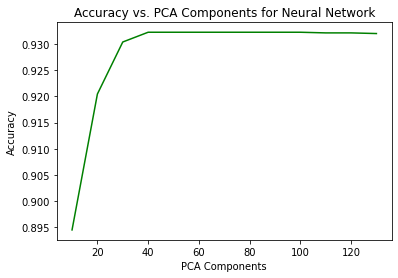

In [ ]:
# Plotting the graph for number of PCA components versus accuracy 

print(full_score)
plt.plot(pca_index, full_score, 'g')
plt.xlabel("PCA Components")
plt.ylabel("Accuracy")
plt.title("Accuracy vs. PCA Components for Neural Network")
plt.show()

[0.89446861 0.92044748 0.93039155 0.93225606 0.93225606 0.93225606
 0.93225606 0.93225606 0.93225606 0.93225606 0.93213176 0.93213176
 0.93200746]


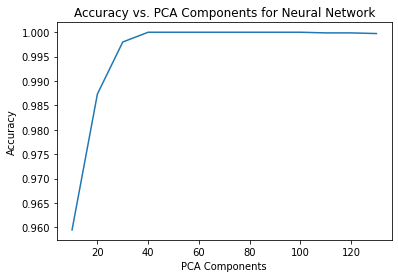

In [ ]:
# Making a graph, except the values are all relative to the maximum value, we didnt end up using this graph
print(full_score)
plt.plot(pca_index, (full_score / full_score.max()))
plt.xlabel("PCA Components")
plt.ylabel("Accuracy")
plt.title("Accuracy vs. PCA Components for Neural Network")
plt.show()

In [ ]:
#Logistic classifier model with 30 principal components
pca = PCA(n_components = 30) #call PCA class
pca.fit(X_train)
X_train_pca = pca.transform(X_train)
X_test_pca = pca.transform(X_test)
grid={"C":np.logspace(-3,3,7), "penalty":["l2"], "max_iter":[10000], "solver":["lbfgs"]}
lr_pca = LogisticRegression()
lr_pca = GridSearchCV(lr_pca, grid, n_jobs = -1, verbose = 3, cv = 5)
lr_pca.fit(X_train_pca, y_train)

print(lr_pca.best_estimator_)

y_predict_lr_pca = lr_pca.predict(X_test_pca)

label_decoded_y_lr_pca = label_encoder.inverse_transform(y_predict_lr_pca)
accuracy_score(label_decoded_y_actual, label_decoded_y_lr_pca) 

Fitting 5 folds for each of 7 candidates, totalling 35 fits
LogisticRegression(C=10.0, max_iter=10000)


0.9322560596643878

In [ ]:
#Plotting the correct prediction percentage for our logistic classifier model with 30 principal components
#Note: The label (percentage correct) are not shown in this iteration because the built in label function is not in the older version of MatPlotLib that
#is defaulted in colab. Please refer to the paper for the completed figure

lr_pca_cm = confusion_matrix(label_decoded_y_actual, label_decoded_y_lr_pca, normalize = 'true')
lr_pca_cm_perc = lr_pca_cm.diagonal()

fig = plt.figure()
ax = fig.add_axes([0,0,1,1])
lr_cm_pca_perc_sorted = sorted(zip(prognosis_unique, lr_pca_cm_perc), key = lambda x:x[1])
prognosis_unique_sorted_lr_pca =[]
lr_pca_cm_sorted = []
for a, b in lr_cm_pca_perc_sorted:
    prognosis_unique_sorted_lr_pca.append(a)
    lr_pca_cm_sorted.append(b)
    
bars = ax.barh(prognosis_unique_sorted_lr_pca,lr_pca_cm_sorted, color = ['r' if a < 0.85 else 'g' for a in lr_pca_cm_sorted])
ax.set_title('Logistic Regression PCA n = 30', fontsize = 30)
ax.set_xlabel('Accuracy', fontsize = 25)
ax.set_ylabel('Predicted Prognosis', fontsize = 25)
# ax.bar_label(bars, fontsize = 15)
ax.set_xlim(xmin = 0.7)
for label in (ax.get_xticklabels() + ax.get_yticklabels()):
    label.set_fontsize(16)
fig.set_size_inches(15,10)
fig.set_dpi(1000)
plt.show()

In [ ]:
#Plotting the correct prediction percentage for our neural network model 
#Note: The label (percentage correct) are not shown in this iteration because the built in label function is not in the older version of MatPlotLib that
#is defaulted in colab. Please refer to the paper for the completed figure

mlp_pred_decoded = label_encoder.inverse_transform(y_predict_lr_pca)

nn_cm = confusion_matrix(label_decoded_y_actual, label_decoded_y_NN, normalize = 'true')
nn_cm_perc = nn_cm.diagonal()

fig = plt.figure()
ax = fig.add_axes([0,0,1,1])

nn_cm_perc_sorted = sorted(zip(prognosis_unique, nn_cm_perc), key = lambda x:x[1])
prognosis_sorted = []
sorted_percentage = []
for a,b in nn_cm_perc_sorted:
    prognosis_sorted.append(a)
    sorted_percentage.append(b)
bars = ax.barh(prognosis_sorted, sorted_percentage, color = ['r' if a < 0.85 else 'g' for a in sorted_percentage])

ax.set_title('Neural Network', fontsize = 30)
ax.set_xlabel('Accuracy', fontsize = 25)
ax.set_ylabel('Predicted Prognosis', fontsize = 25)
# ax.bar_label(bars, fontsize = 15)
ax.set_xlim(xmin = 0.7)
for label in (ax.get_xticklabels() + ax.get_yticklabels()):
    label.set_fontsize(16)
fig.set_size_inches(15,10)
fig.set_dpi(1000)
    
plt.savefig("nn_accuracy.jpeg", bbox_inches='tight')

In [ ]:
 #getting the count of each disease and calculating the percentage of their occurance within our dataset
 def get_integer_mapping(le):
    res = {}
    for cl in le.classes_:
        res.update({cl:le.transform([cl])[0]})

    return res

integerMapping = get_integer_mapping(label_encoder)

prognosis_count = collections.Counter(prognosis)
print(len(prognosis_count.keys()))
print(prognosis_count.values())
print(sum(prognosis_count.values()))
print(prognosis_count)
prognosis_percentage_list = [a/5362 for a in prognosis_count.values()]
print(prognosis_percentage_list)
label_decoded_y_train = label_encoder.inverse_transform(y_train)

symptoms_np = symptoms.to_numpy()
symptoms_np_1d = symptoms_np.flatten()
symptoms_count = collections.Counter(symptoms_np_1d)
symptoms_unique = list(symptoms_count.keys())

41
dict_values([368, 180, 191, 145, 237, 244, 198, 124, 155, 103, 196, 131, 157, 112, 129, 135, 140, 126, 118, 109, 88, 130, 121, 100, 92, 104, 141, 88, 95, 91, 111, 93, 106, 121, 77, 100, 87, 87, 81, 66, 85])
5362
Counter({'Fungal infection': 368, 'Allergy': 244, 'Chronic cholestasis': 237, 'Drug Reaction': 198, 'Gastroenteritis': 196, 'GERD': 191, 'AIDS': 180, 'Tuberculosis': 157, 'Hypertension ': 155, 'Jaundice': 145, 'Hepatitis C': 141, 'Cervical spondylosis': 140, 'Migraine': 135, 'Diabetes ': 131, 'Dengue': 130, 'Peptic ulcer diseae': 129, 'Malaria': 126, 'Varicose veins': 124, 'Chicken pox': 121, 'hepatitis A': 121, 'Hepatitis B': 118, 'Paralysis (brain hemorrhage)': 112, 'Heart attack': 111, 'Typhoid': 109, 'Hypoglycemia': 106, 'Common Cold': 104, 'Hypothyroidism': 103, 'Bronchial Asthma': 100, 'Arthritis': 100, 'Hyperthyroidism': 95, 'Osteoarthristis': 93, 'Alcoholic hepatitis': 92, 'Hepatitis D': 91, 'Pneumonia': 88, 'Acne': 88, 'Hepatitis E': 87, 'Urinary tract infection': 8

In [ ]:
#Plotting the percentages of each diseases with respect to our dataset
fig = plt.figure()
ax = fig.add_axes([0,0,1,1])
prognosis_count_list = list(prognosis_count.keys())
prognosis_label = [(prognosis_percentage_list[i], list(prognosis_count.values())[i]) for i in range(0, len(prognosis_percentage_list))]
print(prognosis_label)

prognosis_percentage = sorted(zip(prognosis_count_list, prognosis_percentage_list), key = lambda x:x[1])
prognosis_sorted_perc =[]
prongnosis_sorted_label = []
for a, b in prognosis_percentage:
    prongnosis_sorted_label.append(a)
    prognosis_sorted_perc.append(b)

bars = ax.barh(prongnosis_sorted_label,prognosis_sorted_perc)
# ax.bar_label(bars, fontsize = 15, labels = ['±%.4f'])
ax.set_xlim(xmin = 0)
for label in (ax.get_xticklabels() + ax.get_yticklabels()):
    label.set_fontsize(16)
ax.set_title('Percentage of Prognosis', fontsize = 30)
ax.set_xlabel('Percentage', fontsize = 25)
ax.set_ylabel('Prognosis', fontsize = 25)
fig.set_size_inches(15,10)
fig.set_dpi(1000)
plt.savefig("percentage_of_prog.jpeg", bbox_inches = "tight")

[(0.06863110779559865, 368), (0.03356956359567326, 180), (0.03562103692651995, 191), (0.027042148452070123, 145), (0.044199925400969786, 237), (0.04550540842969041, 244), (0.03692651995524058, 198), (0.023125699365908244, 124), (0.028907124207385303, 155), (0.019209250279746362, 103), (0.03655352480417755, 196), (0.02443118239462887, 131), (0.02928011935844834, 157), (0.020887728459530026, 112), (0.024058187243565832, 129), (0.025177172696754943, 135), (0.02610966057441253, 140), (0.02349869451697128, 126), (0.022006713912719134, 118), (0.020328235732935473, 109), (0.01641178664677359, 88), (0.02424468481909735, 130), (0.02256620663931369, 121), (0.01864975755315181, 100), (0.017157776948899663, 92), (0.01939574785527788, 104), (0.02629615814994405, 141), (0.01641178664677359, 88), (0.017717269675494217, 95), (0.016971279373368148, 91), (0.020701230883998507, 111), (0.017344274524431182, 93), (0.01976874300634092, 106), (0.02256620663931369, 121), (0.014360313315926894, 77), (0.0186497

In [ ]:
#Calculating the training, testing and cross validation accuracies for our logistic classifier

test_size_val = [5, 10, 15, 20, 25, 30, 35, 40, 45, 50]
accuracy_output_test = []
accuracy_output_train = []
accuracy_output_cv = []

for a in test_size_val:
    X_train, X_test, y_train, y_test = train_test_split(one_hot_encoded_data, label_encoded_y, test_size=a/100, random_state=42, stratify = prognosis)
    lr = LogisticRegression()
    grid={"C": np.logspace(-3, 3, 7), "penalty":["l2"], "max_iter":[10000], "solver":["lbfgs"]}
    lr = GridSearchCV(lr, grid, n_jobs = -1, verbose = 3, cv = 5)

    lr.fit(X_train, y_train)
    print(lr.best_estimator_)
    y_predict_lr_test = lr.predict(X_test)
    label_decoded_y_lr_test = label_encoder.inverse_transform(y_predict_lr_test)
    y_predict_lr_train = lr.predict(X_train)
    label_decoded_y_lr_train = label_encoder.inverse_transform(y_predict_lr_train)
    label_decoded_train = label_encoder.inverse_transform(y_train)
    label_decoded_test = label_encoder.inverse_transform(y_test)
    accuracy_output_train.append(accuracy_score(label_decoded_train, label_decoded_y_lr_train))
    accuracy_output_test.append(accuracy_score(label_decoded_test, label_decoded_y_lr_test))
    scores = cross_val_score(lr, X_train, y_train, scoring='accuracy', cv=5)
    accuracy_output_cv.append(np.mean(scores))
    print(np.mean(scores))
    
print(accuracy_output_train)

Fitting 5 folds for each of 1 candidates, totalling 5 fits
LogisticRegression(C=0.1, max_iter=10000)
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
0.9383472374588131
Fitting 5 folds for each of 1 candidates, totalling 5 fits
LogisticRegression(C=0.1, max_iter=10000)
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
0.938238341968912
Fitting 5 folds for each of 1 candidates, totalling 5 fits
LogisticRegression(C=0.1, max_iter=10000)
Fitting 5 folds for each of 1 candidates, totalling 5 fits


KeyboardInterrupt: ignored

In [ ]:
#Plotting the accuracy of the training, test, and cross validation sets for our logistic classifier
plt.plot(test_size_val, accuracy_output_cv, label = 'cv accuracy', marker = 'o')
plt.plot(test_size_val, accuracy_output_test,label ='test accuracy', marker = 'x')
plt.plot(test_size_val, accuracy_output_train, label = 'train accuracy', marker = 'v')

print(accuracy_output_cv)
print(accuracy_output_train)
plt.title('Accuracy of Logistic Classifier with Varying Train-Test Splits')
plt.xlabel('Test Percentage')
plt.ylabel('Accuracy')
plt.legend()
plt.plot()



In [ ]:
#Calculating the training, testing and cross validation accuracies for our neural network 
test_size_val = [5, 10, 15, 20, 25, 30, 35, 40, 45, 50]
accuracy_output_test = []
accuracy_output_train = []
accuracy_output_cv = []

for a in test_size_val:
    X_train, X_test, y_train, y_test = train_test_split(one_hot_encoded_data, label_encoded_y, test_size=a/100, random_state=42, stratify = prognosis)
    nn = MLPClassifier(solver='adam', hidden_layer_sizes = 10, activation = "tanh", max_iter = 10000)
    
    nn.fit(X_train, y_train)
    y_predict_nn_test = nn.predict(X_test)
    label_decoded_y_nn_test = label_encoder.inverse_transform(y_predict_nn_test)
    y_predict_nn_train = nn.predict(X_train)
    label_decoded_y_nn_train = label_encoder.inverse_transform(y_predict_nn_train)
    label_decoded_train = label_encoder.inverse_transform(y_train)
    label_decoded_test = label_encoder.inverse_transform(y_test)
    accuracy_output_train.append(accuracy_score(label_decoded_train, label_decoded_y_nn_train))
    accuracy_output_test.append(accuracy_score(label_decoded_test, label_decoded_y_nn_test))
    scores = cross_val_score(nn, X_train, y_train, scoring='accuracy', cv=5)
    accuracy_output_cv.append(np.mean(scores))
    print(np.mean(scores))
print(accuracy_output_train)

0.9365806069743634
0.9363730569948187
0.9363616230477401


/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:699: UserWarning: Training interrupted by user.
  warnings.warn("Training interrupted by user.")
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:699: UserWarning: Training interrupted by user.
  warnings.warn("Training interrupted by user.")
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:699: UserWarning: Training interrupted by user.
  warnings.warn("Training interrupted by user.")


0.9368165090452137


/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:699: UserWarning: Training interrupted by user.
  warnings.warn("Training interrupted by user.")
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:699: UserWarning: Training interrupted by user.
  warnings.warn("Training interrupted by user.")
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:699: UserWarning: Training interrupted by user.
  warnings.warn("Training interrupted by user.")
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:699: UserWarning: Training interrupted by user.
  warnings.warn("Training interrupted by user.")
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:699: UserWarning: Training interrupted by user.
  warnings.warn("Training interrupted by user.")
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_p

0.9380732981057445


/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:699: UserWarning: Training interrupted by user.
  warnings.warn("Training interrupted by user.")
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:699: UserWarning: Training interrupted by user.
  warnings.warn("Training interrupted by user.")
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:699: UserWarning: Training interrupted by user.
  warnings.warn("Training interrupted by user.")
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:699: UserWarning: Training interrupted by user.
  warnings.warn("Training interrupted by user.")
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:699: UserWarning: Training interrupted by user.
  warnings.warn("Training interrupted by user.")
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_p

0.9363149578339991


/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:699: UserWarning: Training interrupted by user.
  warnings.warn("Training interrupted by user.")
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:699: UserWarning: Training interrupted by user.
  warnings.warn("Training interrupted by user.")
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:699: UserWarning: Training interrupted by user.
  warnings.warn("Training interrupted by user.")
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:699: UserWarning: Training interrupted by user.
  warnings.warn("Training interrupted by user.")
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:699: UserWarning: Training interrupted by user.
  warnings.warn("Training interrupted by user.")
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_p

0.938593974175036


/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:699: UserWarning: Training interrupted by user.
  warnings.warn("Training interrupted by user.")
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:699: UserWarning: Training interrupted by user.
  warnings.warn("Training interrupted by user.")


0.9362842073742067


/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:699: UserWarning: Training interrupted by user.
  warnings.warn("Training interrupted by user.")
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:699: UserWarning: Training interrupted by user.
  warnings.warn("Training interrupted by user.")


0.9328600615809617
0.9317456016009338
[0.9391321421559002, 0.9390673575129533, 0.9389949528198376, 0.9396129633947307, 0.9395672718229297, 0.9379163335997869, 0.9385939741750359, 0.9393845197388871, 0.9396405561207188, 0.938082804923536]


[0.9365806069743634, 0.9363730569948187, 0.9363616230477401, 0.9368165090452137, 0.9380732981057445, 0.9363149578339991, 0.938593974175036, 0.9362842073742067, 0.9328600615809617, 0.9317456016009338]
[0.9391321421559002, 0.9390673575129533, 0.9389949528198376, 0.9396129633947307, 0.9395672718229297, 0.9379163335997869, 0.9385939741750359, 0.9393845197388871, 0.9396405561207188, 0.938082804923536]


[]

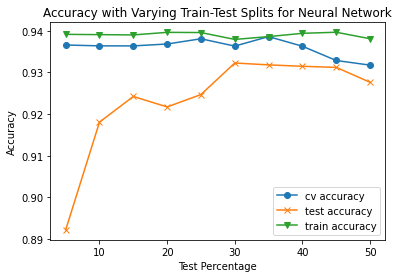

In [ ]:
#Plotting the accuracy of the training, test, and cross validation sets for our neural network 
plt.plot(test_size_val, accuracy_output_cv, label = 'cv accuracy', marker = 'o')
plt.plot(test_size_val, accuracy_output_test,label ='test accuracy', marker = 'x')
plt.plot(test_size_val, accuracy_output_train, label = 'train accuracy', marker = 'v')

print(accuracy_output_cv)
print(accuracy_output_train)
plt.title('Accuracy with Varying Train-Test Splits for Neural Network')
plt.xlabel('Test Percentage')
plt.ylabel('Accuracy')
plt.legend()
plt.plot()




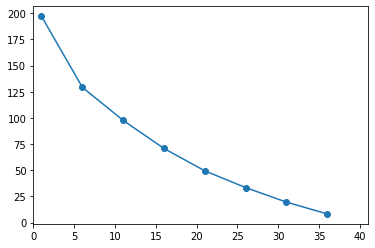

In [ ]:
#Plotting the distortion for each additional cluster using the average vectors
distortions = []
for i in range (1, 41, 5):
    km = KMeans(n_clusters = i, init = 'k-means++', n_init = 1000, max_iter = 10000, random_state = 0)
    km.fit_predict(average_vector, prognosis_unique)
    distortions.append(km.inertia_)
plt.plot(range(1, 41, 5), distortions, marker = 'o')
plt.xlim([0, 41])
plt.show()




In [ ]:
#Performing kmeans clustering on the optimal number of clusters from the above elbow plot (13 clusters)
km_best = KMeans(n_clusters = 13, init = 'k-means++', n_init = 10000, max_iter = 100000, random_state = 0, algorithm = 'elkan')
y_out_km = km_best.fit_predict(average_vector)
km_labels = km_best.labels_
print(y_out_km)


[ 1  4  4  1  4  4  6  4 11  2  3 11  0  4  4  4  1  1  1 10  2  2  2  1
  5  8  9  4  2  7 12  4  1  1  6  4  6  7  4  4  2]


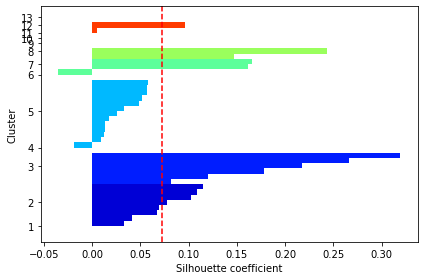

In [ ]:
#Plotting the silhouette plot for the optimal set of clusters from the above elbow plot (13 clusters)
cluster_labels = np.unique(km_labels) #take unique cluster labels
n_clusters = cluster_labels.shape[0]
silhouette_vals = silhouette_samples(average_vector, km_labels, metric='euclidean') #get the silhouette coefficients of each cluster
y_ax_lower, y_ax_upper = 0, 0
yticks = []
for i, c in enumerate(cluster_labels):
    c_silhouette_vals = silhouette_vals[km_labels == c]
    c_silhouette_vals.sort()
    y_ax_upper += len(c_silhouette_vals)
    color = cm.jet(float(i) / n_clusters)
    plt.barh(range(y_ax_lower, y_ax_upper), c_silhouette_vals, height=1.0, 
             edgecolor='none', color=color)

    yticks.append((y_ax_lower + y_ax_upper) / 2.)
    y_ax_lower += len(c_silhouette_vals)
    
silhouette_avg = np.mean(silhouette_vals)
plt.axvline(silhouette_avg, color="red", linestyle="--") 

plt.yticks(yticks, cluster_labels + 1)
plt.ylabel('Cluster')
plt.xlabel('Silhouette coefficient')
plt.tight_layout()
plt.show()

In [ ]:
#performing agglomerative clustering 
ag = AgglomerativeClustering(n_clusters = 8,affinity = 'euclidean', linkage = 'ward')
y_out_ag = ag.fit_predict(average_vector)
ag_labels = ag.labels_ 
print(y_out_ag)

total = []
for k in range(0, 20):
    temp = []
    for i in range(0,41):
        if ag_labels[i] == k:
            temp.append(prognosis_unique[i])
    total.append(temp)
    
print(total)

[1 1 1 2 1 1 4 1 0 2 6 0 3 1 1 1 1 1 1 2 2 2 2 1 3 7 5 1 2 0 7 1 1 2 4 1 4
 0 1 3 2]
[['Chicken pox', 'Dengue', 'Malaria', 'Typhoid'], ['(vertigo) Paroymsal  Positional Vertigo', 'AIDS', 'Acne', 'Allergy', 'Arthritis', 'Cervical spondylosis', 'Dimorphic hemmorhoids(piles)', 'Drug Reaction', 'Fungal infection', 'GERD', 'Gastroenteritis', 'Heart attack', 'Hypertension ', 'Impetigo', 'Osteoarthristis', 'Paralysis (brain hemorrhage)', 'Psoriasis', 'Urinary tract infection'], ['Alcoholic hepatitis', 'Chronic cholestasis', 'Hepatitis B', 'Hepatitis C', 'Hepatitis D', 'Hepatitis E', 'Jaundice', 'Peptic ulcer diseae', 'hepatitis A'], ['Diabetes ', 'Hyperthyroidism', 'Varicose veins'], ['Bronchial Asthma', 'Pneumonia', 'Tuberculosis'], ['Hypothyroidism'], ['Common Cold'], ['Hypoglycemia', 'Migraine'], [], [], [], [], [], [], [], [], [], [], [], []]


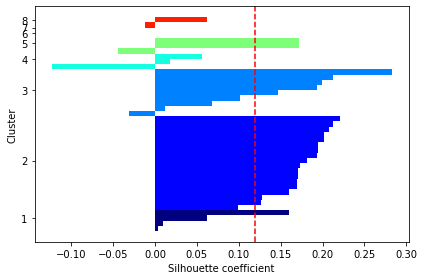

In [ ]:
#plotting the silhouette plot for the agglomerative clustering 
cluster_labels = np.unique(y_out_ag) #take unique cluster labels
n_clusters = cluster_labels.shape[0]
silhouette_vals = silhouette_samples(average_vector, y_out_ag, metric='euclidean') #get the silhouette coefficients of each cluster
y_ax_lower, y_ax_upper = 0, 0
yticks = []
for i, c in enumerate(cluster_labels):
    c_silhouette_vals = silhouette_vals[y_out_ag == c]
    c_silhouette_vals.sort()
    y_ax_upper += len(c_silhouette_vals)
    color = cm.jet(float(i) / n_clusters)
    plt.barh(range(y_ax_lower, y_ax_upper), c_silhouette_vals, height=1.0, 
             edgecolor='none', color=color)

    yticks.append((y_ax_lower + y_ax_upper) / 2.)
    y_ax_lower += len(c_silhouette_vals)
    
silhouette_avg = np.mean(silhouette_vals)
plt.axvline(silhouette_avg, color="red", linestyle="--") 

plt.yticks(yticks, cluster_labels + 1)
plt.ylabel('Cluster')
plt.xlabel('Silhouette coefficient')
plt.tight_layout()
plt.show()

In [ ]:
#fitting a PCA transform of 3 principal components for the average vectors
pca = PCA(n_components = 3) #call PCA class
pca.fit(average_vector)
avg_vec_trans = pca.transform(average_vector)

print(avg_vec_trans)
print(pca.explained_variance_ratio_)   #print explained variance of each PC


print(avg_vec_trans.shape)



[[-0.10405233 -0.19773742 -0.36716076]
 [-0.52296216  0.02097635 -0.34295976]
 [-0.60894504 -0.32153985 -0.3069532 ]
 [ 0.28403105 -0.79017108 -0.29591288]
 [-0.56914736  0.08391456 -0.40339558]
 [-0.80577177 -0.29103169 -0.22162336]
 [-0.23105522  0.60184943  0.01539257]
 [-0.7484661  -0.29259029 -0.32362342]
 [ 0.49551217  0.82423838  0.12519195]
 [ 1.06787474 -0.9179682  -0.1101809 ]
 [ 0.21930339  2.52577406 -0.48151267]
 [ 1.28045549  0.94257055 -0.35392984]
 [-0.59156723  0.07805393  1.45672434]
 [-0.70663623 -0.29726128 -0.36087915]
 [-0.69263787 -0.36312982 -0.40450779]
 [-0.67121775 -0.3377191  -0.37731793]
 [-0.42927534  0.13809311 -0.52105235]
 [-0.36614415 -0.32665399 -0.31231995]
 [-0.36496674  0.19324349 -0.30574458]
 [ 1.25552951 -0.57814902  0.74639431]
 [ 0.59194603 -0.39489703  0.30548737]
 [ 1.59255281 -0.92838935  0.18711872]
 [ 2.01587638 -0.78273648  0.12165598]
 [-0.68731175  0.03656475 -0.3402054 ]
 [-0.6595655   0.28436694  1.63408583]
 [ 0.00688248  0.27019032

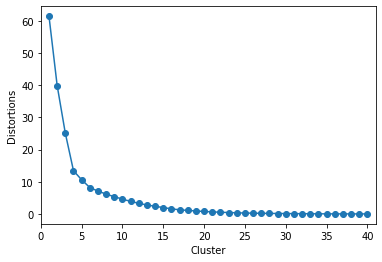

In [ ]:
#Plotting the distortion for each additional cluster using PCA average vectors
distortions = []
for i in range (1, 41, 1):
    km = KMeans(n_clusters = i, init = 'k-means++', n_init = 1000, max_iter = 10000, random_state = 0)
    km.fit_predict(avg_vec_trans, prognosis_unique)
    distortions.append(km.inertia_)
    


plt.plot(range(1, 41, 1), distortions, marker = 'o')
plt.xlim([0, 41])
plt.xlabel('Cluster')
plt.ylabel('Distortions')
plt.show()




In [ ]:
#Performing agglomerative clustering for the PCA average vectors 
ag = AgglomerativeClustering(n_clusters = 10,affinity = 'euclidean', linkage = 'ward')
y_out_ag = ag.fit_predict(avg_vec_trans)
ag_labels = ag.labels_ 
print(y_out_ag)

total = []
for k in range(0, 20):
    temp = []
    for i in range(0,41):
        if ag_labels[i] == k:
            temp.append(prognosis_unique[i])
    total.append(temp)
    
print(total)

[0 0 0 8 0 0 3 0 1 5 9 1 2 0 0 0 0 0 0 7 7 5 5 0 2 2 2 0 7 1 6 0 0 8 3 0 4
 1 0 6 5]
[['(vertigo) Paroymsal  Positional Vertigo', 'AIDS', 'Acne', 'Allergy', 'Arthritis', 'Cervical spondylosis', 'Dimorphic hemmorhoids(piles)', 'Drug Reaction', 'Fungal infection', 'GERD', 'Gastroenteritis', 'Heart attack', 'Hypertension ', 'Impetigo', 'Osteoarthristis', 'Paralysis (brain hemorrhage)', 'Psoriasis', 'Urinary tract infection'], ['Chicken pox', 'Dengue', 'Malaria', 'Typhoid'], ['Diabetes ', 'Hyperthyroidism', 'Hypoglycemia', 'Hypothyroidism'], ['Bronchial Asthma', 'Pneumonia'], ['Tuberculosis'], ['Chronic cholestasis', 'Hepatitis D', 'Hepatitis E', 'hepatitis A'], ['Migraine', 'Varicose veins'], ['Hepatitis B', 'Hepatitis C', 'Jaundice'], ['Alcoholic hepatitis', 'Peptic ulcer diseae'], ['Common Cold'], [], [], [], [], [], [], [], [], [], []]


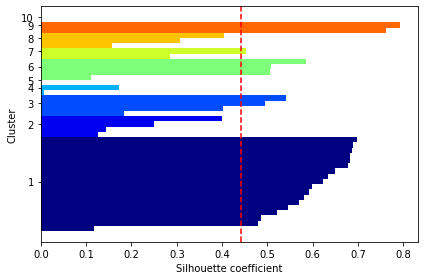

(41,)
[0.11670864 0.63404758 0.67869459 0.7918039  0.62297876 0.52146742
 0.00637469 0.64955484 0.14443738 0.11006054 0.         0.12625709
 0.49491313 0.6888287  0.68690408 0.69742508 0.58031389 0.47899017
 0.48588679 0.15684224 0.30636426 0.50493498 0.50802561 0.59233771
 0.54025237 0.18361693 0.4026342  0.68177911 0.40329908 0.25013225
 0.45175044 0.5705077  0.54461342 0.76268056 0.17144108 0.59894416
 0.         0.39879316 0.68143218 0.28597411 0.58500264]


In [ ]:
#Plotting the silhouette plot for the agglomerative clustering on the PCA average vectors 

cluster_labels = np.unique(y_out_ag) #take unique cluster labels
n_clusters = cluster_labels.shape[0]
silhouette_vals = silhouette_samples(avg_vec_trans, y_out_ag, metric='euclidean') #get the silhouette coefficients of each cluster
y_ax_lower, y_ax_upper = 0, 0
yticks = []
for i, c in enumerate(cluster_labels):
    c_silhouette_vals = silhouette_vals[y_out_ag == c]
    c_silhouette_vals.sort()
    y_ax_upper += len(c_silhouette_vals)
    color = cm.jet(float(i) / n_clusters)
    plt.barh(range(y_ax_lower, y_ax_upper), c_silhouette_vals, height=1.0, 
             edgecolor='none', color=color)

    yticks.append((y_ax_lower + y_ax_upper) / 2.)
    y_ax_lower += len(c_silhouette_vals)
    
silhouette_avg = np.mean(silhouette_vals)
plt.axvline(silhouette_avg, color="red", linestyle="--") 

plt.yticks(yticks, cluster_labels+1)
plt.ylabel('Cluster')
plt.xlabel('Silhouette coefficient')
plt.tight_layout()
plt.show()
print(silhouette_vals.shape)
print(silhouette_vals)

In [ ]:
#Performing Kmeans clustering using the optimal number of clusters from the above elbow plot (4) using PCA average vector
km_best = KMeans(n_clusters = 4, init = 'k-means++', n_init = 10000, max_iter = 100000, random_state = 0, algorithm = 'elkan')
y_out_km = km_best.fit_predict(avg_vec_trans)
km_labels = km_best.labels_
print(y_out_km)



[0 0 0 0 0 0 0 0 2 1 2 2 3 0 0 0 0 0 0 1 1 1 1 0 3 3 3 0 1 2 3 0 0 0 2 0 2
 2 0 0 1]


In [ ]:
#Printing the clusters
total = []
for k in range(0, 15):
    temp = []
    for i in range(0,41):
        if km_labels[i] == k:
            temp.append(prognosis_unique[i])
    total.append(temp)

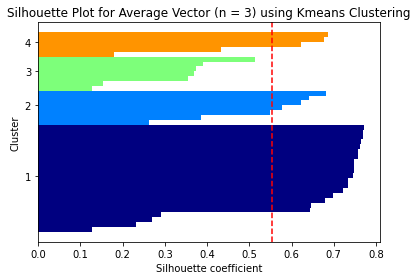

In [ ]:
#Plotting the silhouette plot for the PCA  average vectors 
cluster_labels = np.unique(km_labels) #take unique cluster labels
n_clusters = cluster_labels.shape[0]
silhouette_vals = silhouette_samples(avg_vec_trans, km_labels, metric='euclidean') #get the silhouette coefficients of each cluster
y_ax_lower, y_ax_upper = 0, 0
yticks = []
for i, c in enumerate(cluster_labels):
    c_silhouette_vals = silhouette_vals[km_labels == c]
    c_silhouette_vals.sort()
    y_ax_upper += len(c_silhouette_vals)
    color = cm.jet(float(i) / n_clusters)
    plt.barh(range(y_ax_lower, y_ax_upper), c_silhouette_vals, height=1.0, 
             edgecolor='none', color=color)

    yticks.append((y_ax_lower + y_ax_upper) / 2.)
    y_ax_lower += len(c_silhouette_vals)
    
silhouette_avg = np.mean(silhouette_vals)
plt.axvline(silhouette_avg, color="red", linestyle="--") 

plt.yticks(yticks, cluster_labels + 1)
plt.ylabel('Cluster')
plt.xlabel('Silhouette coefficient')
plt.title('Silhouette Plot for Average Vector (n = 3) using Kmeans Clustering')
plt.tight_layout()
plt.show()

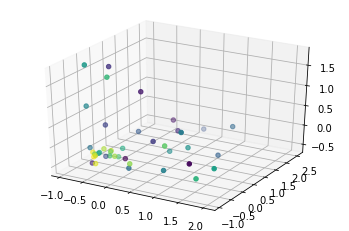

In [ ]:
#3d plot of the average vector after PCA transform using n = 3 components and Colored by k-means clustering results
average_vectorRA = (np.array(average_vector))

AVpca = PCA(n_components=3) #call PCA class
AVPCA = AVpca.fit_transform(average_vectorRA) #apply pca
AVpca.explained_variance_ratio_   #print explained variance of each PC

fig = plt.figure()
ax = fig.add_subplot(projection='3d')
ax.scatter(AVPCA[:,0], AVPCA[:,1], AVPCA[:,2], c=km.labels_)

plt.show()